In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sh5ezgc0SdXNAgefwOB3")
project = rf.workspace("uroki-nast").project("october-vagons")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.3 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 19.0 MB/s eta 0:00:00


In [4]:
version = project.version(1)
dataset = version.download("yolov11")


Extracting Dataset Version Zip to october-vagons-1 in yolov11:: 100%|██████████| 184/184 [00:00<00:00, 3753.04it/s]


In [5]:
import os
directory_ = "/content/october-vagons-1"
train_dir = directory_ + '/train/images'
val_dir =  directory_ +'/valid/images'
test_dir =  directory_ +'/test/images'
print(len(os.listdir(train_dir)), len(os.listdir(val_dir)), len(os.listdir(test_dir)))

75 8 3


In [6]:
from ultralytics import YOLO

model = YOLO("yolo11x.pt")

results = model.train(data="/content/october-vagons-1/data.yaml", epochs=10, imgsz=320)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 109M/109M [00:00<00:00, 216MB/s] 


Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/october-vagons-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

100%|██████████| 755k/755k [00:00<00:00, 21.9MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1      2784  ultralytics.nn.modules.conv.Conv             [3, 96, 3, 2]                 
  1                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  2                  -1  2    389760  ultralytics.nn.modules.block.C3k2            [192, 384, 2, True, 0.25]     
  3                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
  4                  -1  2   1553664  ultralytics.nn.modules.block.C3k2            [384, 768, 2, True, 0.25]     
  5                  -1  1   5309952  ultralytics.nn.modules.conv.Conv             [768, 768, 3, 2]              
  6                  -1  2   5022720  ultralytics.nn.modules.block.C3k2            [768, 768, 2, True]           
  7                  -1  1   5309952  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 92.2MB/s]


AMP: checks passed ✅


train: Scanning /content/october-vagons-1/train/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 1897.92it/s]

train: New cache created: /content/october-vagons-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/october-vagons-1/valid/labels... 8 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8/8 [00:00<00:00, 2768.06it/s]

val: New cache created: /content/october-vagons-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       5.1G       1.56      3.668      1.584         52        320: 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

                   all          8         33    0.00487      0.611     0.0875     0.0325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.79G      1.384      2.796       1.44         52        320: 100%|██████████| 5/5 [00:02<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

                   all          8         33      0.231      0.547      0.472       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.06G      1.202      1.469      1.252         44        320: 100%|██████████| 5/5 [00:02<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

                   all          8         33      0.391      0.367      0.302      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.09G      1.144      1.253      1.184         52        320: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.77it/s]

                   all          8         33      0.553      0.197      0.186     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.25G       1.12      1.044      1.206         48        320: 100%|██████████| 5/5 [00:01<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.77it/s]

                   all          8         33      0.326       0.34      0.333      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.05G      1.019     0.8776      1.127         46        320: 100%|██████████| 5/5 [00:02<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.97it/s]

                   all          8         33      0.546      0.183      0.184      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.22G      0.946     0.8025      1.088         46        320: 100%|██████████| 5/5 [00:02<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]

                   all          8         33      0.513      0.339        0.3      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.08G      0.941     0.7034      1.086         44        320: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.15it/s]

                   all          8         33      0.344      0.369      0.338      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.24G     0.8436     0.6295      1.055         42        320: 100%|██████████| 5/5 [00:01<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.58it/s]

                   all          8         33      0.245      0.475      0.316      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.08G     0.8204     0.5724      1.018         38        320: 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

                   all          8         33      0.438      0.458      0.359      0.261



10 epochs completed in 0.022 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 114.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11x summary (fused): 464 layers, 56,833,954 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


                   all          8         33       0.23      0.547      0.471       0.33
                Boxcar          1          3     0.0937      0.333      0.127     0.0611
                  Cart          8         20      0.118       0.95       0.66      0.343
              Coupling          3          4          0          0      0.051     0.0217
                Hopper          1          1          0          0      0.199      0.159
            Open wagon          1          1      0.479          1      0.995      0.796
              Tank car          4          4      0.689          1      0.796      0.602
Speed: 0.1ms preprocess, 11.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


In [7]:
full_paths = [os.path.join(test_dir, file) for file in os.listdir(test_dir)]


0: 320x320 1 Boxcar, 7 Carts, 29.2ms
1: 320x320 1 Boxcar, 15 Carts, 1 Tank car, 29.2ms
2: 320x320 1 Boxcar, 26 Carts, 1 Tank car, 29.2ms
Speed: 1.8ms preprocess, 29.2ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)


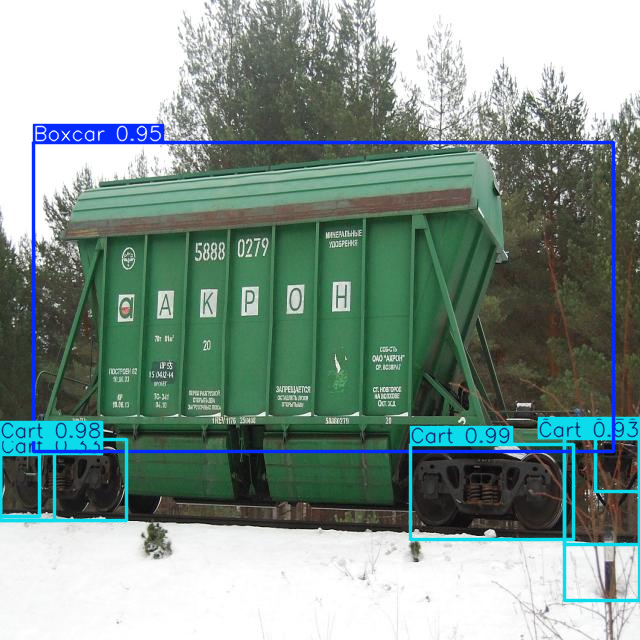

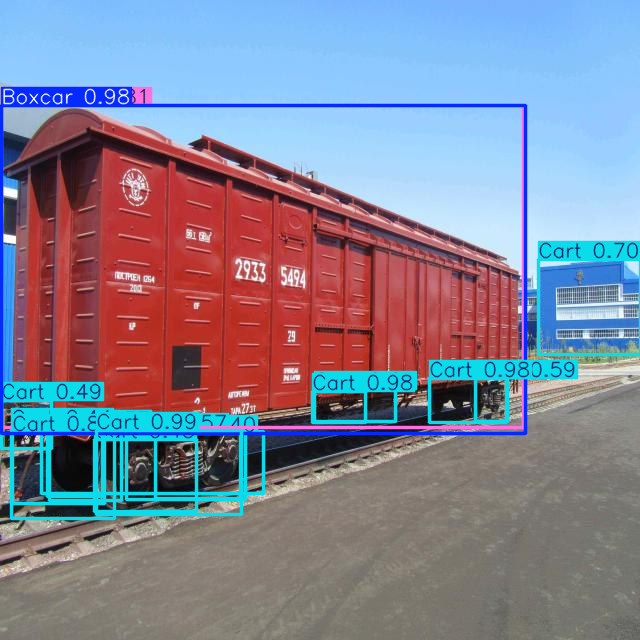

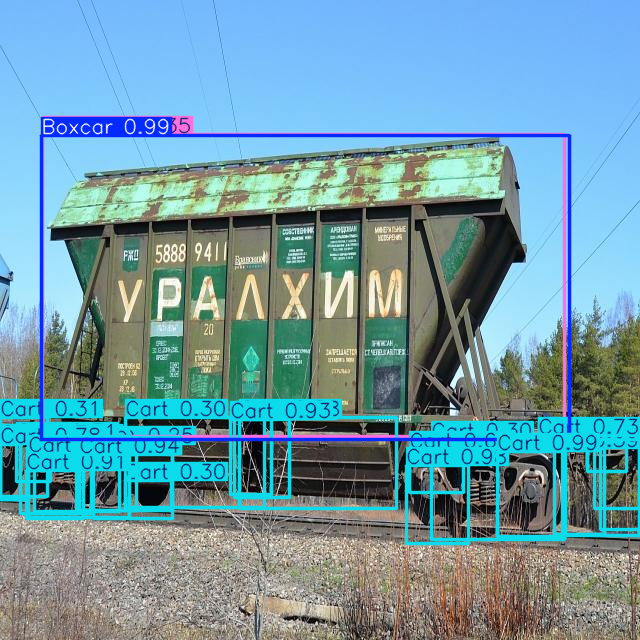

In [8]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")

results = model(full_paths)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    result.show()
    result.save(filename="result.jpg")

In [9]:
metrics = model.val()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/october-vagons-1/valid/labels.cache... 8 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


                   all          8         33      0.228      0.547      0.473      0.331
                Boxcar          1          3     0.0936      0.333      0.128     0.0611
                  Cart          8         20      0.116       0.95      0.671      0.349
              Coupling          3          4          0          0      0.051     0.0217
                Hopper          1          1          0          0      0.199      0.159
            Open wagon          1          1       0.47          1      0.995      0.796
              Tank car          4          4      0.688          1      0.796      0.602
Speed: 0.1ms preprocess, 34.5ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/val


In [10]:
metrics.box.f1

array([    0.14616,     0.20648,           0,           0,     0.63944,     0.81494])

In [11]:
metrics.box.all_ap

array([[    0.12763,      0.1187,      0.1187,      0.1187,      0.1187,   0.0042624,   0.0042624,           0,           0,           0],
       [    0.67064,     0.66552,     0.59032,     0.43371,     0.35255,     0.32527,      0.2114,      0.2114,    0.027165,           0],
       [    0.05097,     0.05097,     0.05097,     0.05097,    0.013345,           0,           0,           0,           0,           0],
       [      0.199,       0.199,       0.199,       0.199,       0.199,       0.199,       0.199,       0.199,           0,           0],
       [      0.995,       0.995,       0.995,       0.995,       0.995,       0.995,       0.995,       0.995,           0,           0],
       [      0.796,       0.796,       0.796,       0.796,       0.796,       0.796,       0.796,     0.44934,           0,           0]])

In [12]:
version = project.version(2)
dataset = version.download("yolov11")


Extracting Dataset Version Zip to october-vagons-2 in yolov11:: 100%|██████████| 582/582 [00:00<00:00, 7678.83it/s]


In [13]:
directory_ = "/content/october-vagons-2"
train_dir = directory_ + '/train/images'
val_dir =  directory_ +'/valid/images'
test_dir =  directory_ +'/test/images'
print(len(os.listdir(train_dir)), len(os.listdir(val_dir)), len(os.listdir(test_dir)))

249 24 12


In [14]:
from ultralytics import YOLO

model = YOLO("yolo11x.pt")

results = model.train(data="/content/october-vagons-2/data.yaml", epochs=10, imgsz=320)

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/october-vagons-2/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

train: Scanning /content/october-vagons-2/train/labels... 249 images, 0 backgrounds, 0 corrupt: 100%|██████████| 249/249 [00:00<00:00, 1948.83it/s]

train: New cache created: /content/october-vagons-2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/october-vagons-2/valid/labels... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<00:00, 425.95it/s]


val: New cache created: /content/october-vagons-2/valid/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.75G      1.415      2.542      1.471         36        320: 100%|██████████| 16/16 [00:07<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         24        102      0.227      0.512      0.357      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.04G      1.228       1.27      1.226         41        320: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         24        102       0.34      0.499      0.399       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.24G      1.225      1.232      1.268         42        320: 100%|██████████| 16/16 [00:05<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         24        102      0.281      0.395      0.317      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.23G      1.228       1.15      1.276         36        320: 100%|██████████| 16/16 [00:05<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

                   all         24        102      0.686      0.305       0.28      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.23G      1.154      1.022      1.242         48        320: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

                   all         24        102      0.347      0.545      0.269      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.22G      1.143      1.019      1.244         43        320: 100%|██████████| 16/16 [00:05<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

                   all         24        102      0.115      0.139      0.117      0.056



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.01G      1.142     0.9308      1.228         43        320: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

                   all         24        102       0.35      0.283      0.216      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.99G      1.073     0.8283      1.212         36        320: 100%|██████████| 16/16 [00:05<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

                   all         24        102      0.417      0.536      0.483      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.02G      1.045     0.7544       1.17         40        320: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         24        102      0.455      0.521       0.54      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.02G       0.96     0.6848      1.125         45        320: 100%|██████████| 16/16 [00:05<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

                   all         24        102      0.542      0.676      0.646      0.464



10 epochs completed in 0.045 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 114.4MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11x summary (fused): 464 layers, 56,833,954 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


                   all         24        102      0.542      0.676      0.646      0.463
                Boxcar          3          5      0.496      0.396      0.506      0.394
                  Cart         23         57      0.812      0.895      0.937      0.657
              Coupling          8         10      0.336      0.709       0.33      0.106
                Hopper          4          6      0.803      0.833      0.894      0.683
            Open wagon          5          6      0.272      0.333      0.355      0.216
              Tank car         12         18      0.535      0.889      0.855      0.724
Speed: 0.1ms preprocess, 9.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


In [15]:
full_paths = [os.path.join(test_dir, file) for file in os.listdir(test_dir)]


0: 320x320 4 Carts, 2 Couplings, 5 Tank cars, 20.8ms
1: 320x320 2 Carts, 3 Couplings, 2 Hoppers, 20.8ms
2: 320x320 2 Carts, 1 Hopper, 20.8ms
3: 320x320 4 Carts, 1 Tank car, 20.8ms
4: 320x320 1 Boxcar, 2 Carts, 2 Couplings, 1 Open wagon, 20.8ms
5: 320x320 4 Carts, 1 Coupling, 1 Open wagon, 20.8ms
6: 320x320 2 Carts, 2 Couplings, 1 Hopper, 20.8ms
7: 320x320 2 Carts, 5 Couplings, 1 Hopper, 20.8ms
8: 320x320 5 Carts, 5 Tank cars, 20.8ms
9: 320x320 2 Carts, 1 Hopper, 20.8ms
10: 320x320 2 Carts, 1 Coupling, 2 Tank cars, 20.8ms
11: 320x320 3 Carts, 2 Hoppers, 20.8ms
Speed: 1.2ms preprocess, 20.8ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 320)


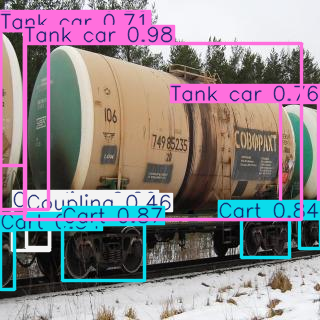

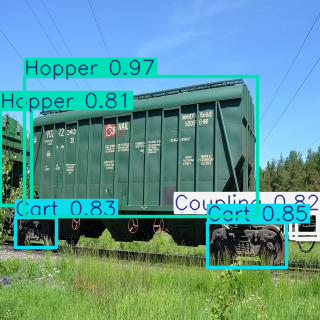

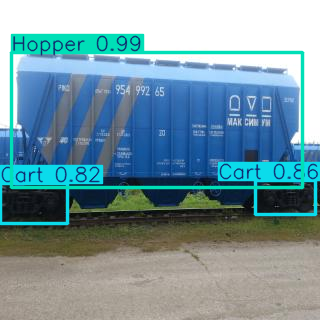

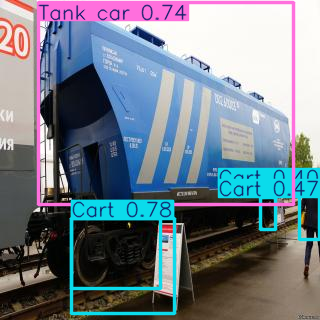

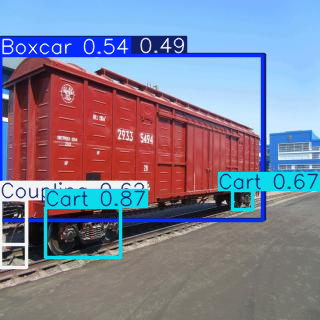

...

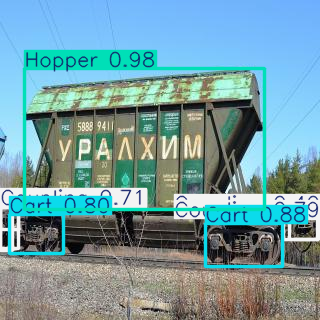

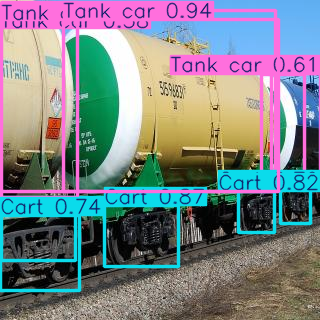

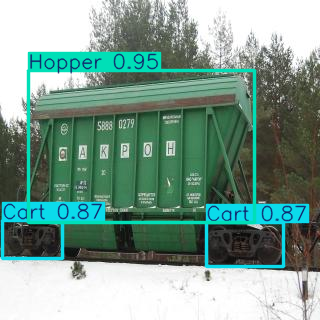

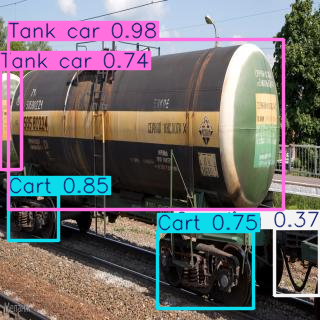

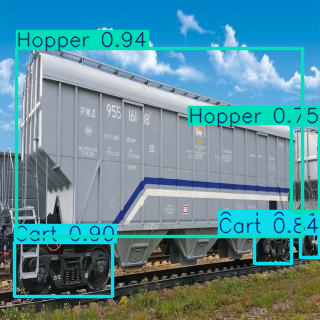

In [16]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")

results = model(full_paths)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    result.show()
    result.save(filename="result.jpg")

In [17]:
metrics = model.val()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/october-vagons-2/valid/labels.cache... 24 images, 0 backgrounds, 0 corrupt: 100%|██████████| 24/24 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]


                   all         24        102      0.542      0.676      0.646      0.464
                Boxcar          3          5      0.496      0.395      0.506      0.394
                  Cart         23         57      0.811      0.895      0.938      0.659
              Coupling          8         10      0.337      0.713      0.331      0.107
                Hopper          4          6      0.804      0.833      0.894      0.683
            Open wagon          5          6      0.272      0.333      0.355      0.216
              Tank car         12         18      0.534      0.889      0.854      0.724
Speed: 0.1ms preprocess, 18.7ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val2


In [18]:
metrics.box.f1

array([    0.43969,     0.85061,     0.45773,     0.81831,     0.29927,     0.66739])

In [19]:
metrics.box.all_ap

array([[    0.50571,     0.50571,     0.48405,     0.48405,     0.48405,     0.48405,     0.43672,     0.29606,     0.25603,           0],
       [     0.9376,     0.92031,     0.90426,     0.86344,     0.80416,     0.79539,     0.73603,     0.46353,      0.1489,    0.016925],
       [     0.3307,      0.2868,     0.23616,      0.1295,    0.079523,     0.01001,           0,           0,           0,           0],
       [    0.89394,     0.89394,     0.89394,     0.89394,     0.89394,     0.74454,     0.66874,     0.66874,     0.28202,           0],
       [    0.35524,     0.35524,     0.35524,     0.35524,     0.35524,     0.12072,     0.12072,     0.11598,    0.025602,           0],
       [    0.85444,     0.85444,     0.85444,     0.85444,     0.85444,     0.84749,      0.8059,     0.77489,      0.4847,    0.053778]])

In [20]:
version.export("coco")
version.download(model_format="coco", location="/content/aphotos2")


Version export complete for coco format



Extracting Dataset Version Zip to /content/aphotos2 in coco:: 100%|██████████| 293/293 [00:00<00:00, 6967.72it/s]


In [21]:
version = project.version(3)
dataset = version.download("yolov11")


Extracting Dataset Version Zip to october-vagons-3 in yolov11:: 100%|██████████| 1382/1382 [00:00<00:00, 8399.38it/s]


In [22]:
directory_ = "/content/october-vagons-3"
train_dir = directory_ + '/train/images'
val_dir =  directory_ +'/valid/images'
test_dir =  directory_ +'/test/images'
print(len(os.listdir(train_dir)), len(os.listdir(val_dir)), len(os.listdir(test_dir)))

600 57 28


In [23]:
from ultralytics import YOLO

model = YOLO("yolo11x.pt")

results = model.train(data="/content/october-vagons-3/data.yaml", epochs=10, imgsz=320)

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/october-vagons-3/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

train: Scanning /content/october-vagons-3/train/labels... 600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<00:00, 1504.60it/s]


train: New cache created: /content/october-vagons-3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/october-vagons-3/valid/labels... 57 images, 0 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<00:00, 774.01it/s]

val: New cache created: /content/october-vagons-3/valid/labels.cache


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.66G      1.399      1.971      1.427         42        320: 100%|██████████| 38/38 [00:16<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         57        293      0.608      0.371      0.392      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.24G      1.346      1.168      1.376         29        320: 100%|██████████| 38/38 [00:13<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         57        293      0.458      0.352       0.29      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.23G      1.329      1.168      1.358         50        320: 100%|██████████| 38/38 [00:13<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         57        293      0.349      0.343      0.228      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.23G      1.308      1.057      1.344         39        320: 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         57        293      0.502       0.34        0.3      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.23G      1.244     0.9785      1.304         42        320: 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         57        293      0.478      0.261      0.232       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.22G        1.2     0.8664      1.269         36        320: 100%|██████████| 38/38 [00:13<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         57        293      0.766      0.607      0.636      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.22G      1.147     0.8043      1.234         42        320: 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         57        293      0.716      0.642      0.678      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.19G      1.072     0.7287      1.198         31        320: 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all         57        293      0.798      0.669      0.686      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.21G      1.035     0.6749      1.177         42        320: 100%|██████████| 38/38 [00:13<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.48it/s]

                   all         57        293      0.866       0.69      0.743      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.22G     0.9881     0.6122      1.149         39        320: 100%|██████████| 38/38 [00:12<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         57        293      0.835      0.682       0.74      0.521



10 epochs completed in 0.086 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 114.4MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11x summary (fused): 464 layers, 56,835,109 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]


                   all         57        293      0.835      0.682       0.74      0.521
                Boxcar          7         10      0.631      0.686       0.79        0.6
                  Cart         57        141      0.859      0.894      0.922      0.628
              Coupling         39         49      0.783      0.776      0.799      0.306
              Dump car          1          1          1          0          0          0
                Hopper         15         20      0.826      0.952      0.977      0.785
            Open wagon         14         21      0.927      0.604      0.796      0.609
              Tank car         28         51      0.819      0.863      0.894      0.716
Speed: 0.1ms preprocess, 7.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train3


In [24]:
full_paths = [os.path.join(test_dir, file) for file in os.listdir(test_dir)]


0: 320x320 3 Carts, 6 Couplings, 1 Hopper, 14.7ms
1: 320x320 1 Boxcar, 3 Carts, 3 Couplings, 14.7ms
2: 320x320 2 Carts, 1 Coupling, 1 Hopper, 14.7ms
3: 320x320 3 Carts, 1 Coupling, 3 Open wagons, 14.7ms
4: 320x320 2 Carts, 1 Coupling, 2 Hoppers, 14.7ms
5: 320x320 1 Boxcar, 2 Carts, 1 Tank car, 14.7ms
6: 320x320 2 Carts, 1 Coupling, 1 Open wagon, 14.7ms
7: 320x320 3 Carts, 1 Open wagon, 14.7ms
8: 320x320 2 Carts, 2 Couplings, 1 Hopper, 14.7ms
9: 320x320 3 Carts, 3 Couplings, 2 Hoppers, 14.7ms
10: 320x320 3 Carts, 2 Hoppers, 14.7ms
11: 320x320 4 Carts, 3 Tank cars, 14.7ms
12: 320x320 2 Carts, 1 Coupling, 2 Tank cars, 14.7ms
13: 320x320 2 Carts, 2 Couplings, 1 Tank car, 14.7ms
14: 320x320 4 Carts, 1 Coupling, 3 Tank cars, 14.7ms
15: 320x320 2 Carts, 2 Couplings, 2 Hoppers, 14.7ms
16: 320x320 2 Carts, 2 Couplings, 1 Hopper, 14.7ms
17: 320x320 3 Carts, 1 Coupling, 1 Open wagon, 14.7ms
18: 320x320 2 Carts, 1 Coupling, 2 Tank cars, 14.7ms
19: 320x320 1 Cart, 3 Couplings, 2 Open wagons, 14.7m

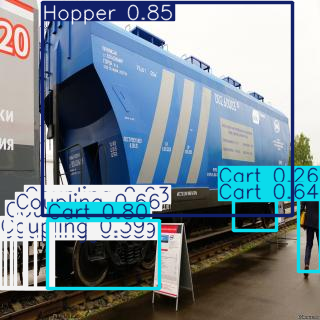

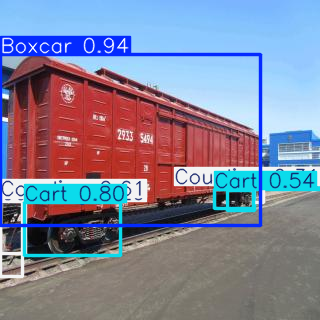

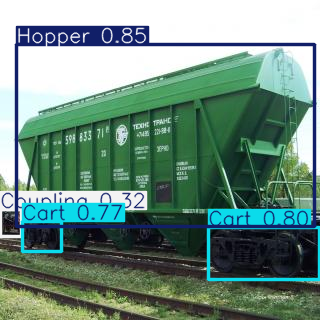

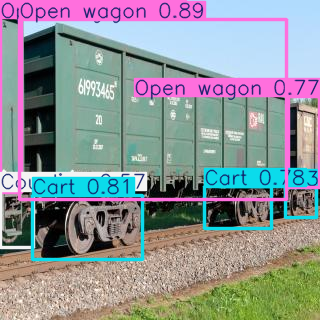

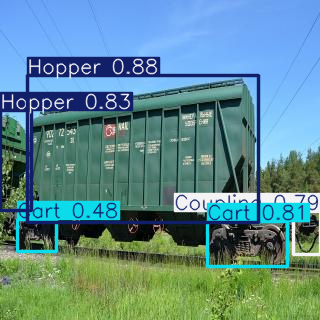

...

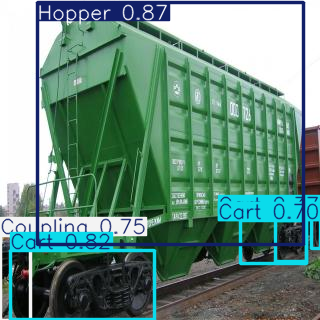

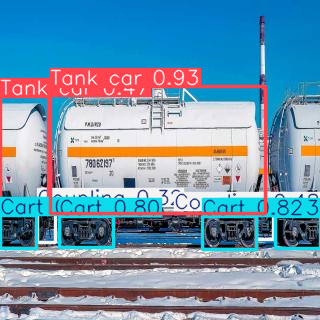

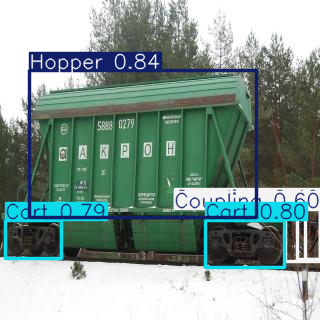

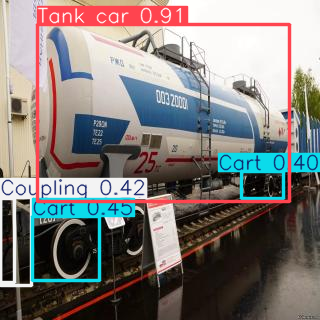

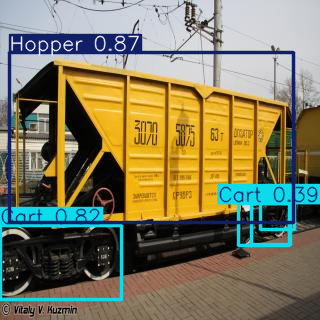

In [25]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train3/weights/best.pt")

results = model(full_paths)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    result.show()
    result.save(filename="result.jpg")

In [26]:
metrics = model.val()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/october-vagons-3/valid/labels.cache... 57 images, 0 backgrounds, 0 corrupt: 100%|██████████| 57/57 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.24it/s]


                   all         57        293      0.835      0.682       0.74       0.52
                Boxcar          7         10      0.631      0.686       0.79        0.6
                  Cart         57        141      0.859      0.894      0.925      0.628
              Coupling         39         49      0.782      0.776      0.798      0.305
              Dump car          1          1          1          0          0          0
                Hopper         15         20      0.826      0.952      0.977      0.783
            Open wagon         14         21      0.927      0.604      0.796       0.61
              Tank car         28         51      0.818      0.863      0.893      0.714
Speed: 0.1ms preprocess, 26.4ms inference, 0.0ms loss, 7.8ms postprocess per image
Results saved to runs/detect/val3


In [27]:
metrics.box.f1

array([    0.65782,       0.876,      0.7787,           0,     0.88486,     0.73165,     0.83986])

In [28]:
metrics.box.all_ap

array([[    0.79017,     0.79017,     0.76896,     0.76896,     0.76477,     0.76477,     0.57773,     0.46393,     0.27004,     0.04484],
       [    0.92518,     0.89256,     0.87019,     0.82611,     0.76112,      0.7031,     0.58624,     0.46875,     0.23868,    0.005542],
       [    0.79825,     0.71168,     0.54668,     0.43395,     0.29585,     0.18272,     0.05054,    0.026102,           0,           0],
       [          0,           0,           0,           0,           0,           0,           0,           0,           0,           0],
       [    0.97722,     0.97722,     0.97722,     0.97722,     0.93566,     0.93566,     0.93566,     0.72716,     0.38411,           0],
       [    0.79646,     0.79646,     0.79646,     0.79646,     0.78344,     0.77893,      0.6004,     0.45743,     0.21346,    0.082569],
       [    0.89338,     0.88004,     0.88004,     0.88004,     0.85749,     0.83013,     0.80615,     0.64116,     0.39193,     0.08281]])

In [29]:
version = project.version(4)
dataset = version.download("yolov11")


Extracting Dataset Version Zip to october-vagons-4 in yolov11:: 100%|██████████| 1526/1526 [00:00<00:00, 7837.02it/s]


In [30]:
directory_ = "/content/october-vagons-4"
train_dir = directory_ + '/train/images'
val_dir =  directory_ +'/valid/images'
test_dir =  directory_ +'/test/images'
print(len(os.listdir(train_dir)), len(os.listdir(val_dir)), len(os.listdir(test_dir)))

663 63 31


In [31]:
from ultralytics import YOLO

model = YOLO("yolo11x.pt")

results = model.train(data="/content/october-vagons-4/data.yaml", epochs=10, imgsz=320)

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/october-vagons-4/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

train: Scanning /content/october-vagons-4/train/labels... 663 images, 0 backgrounds, 0 corrupt: 100%|██████████| 663/663 [00:00<00:00, 1546.82it/s]

train: New cache created: /content/october-vagons-4/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/october-vagons-4/valid/labels... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<00:00, 583.02it/s]

val: New cache created: /content/october-vagons-4/valid/labels.cache


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.91G      1.403      1.877      1.389         28        320: 100%|██████████| 42/42 [00:17<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         63        329      0.729      0.247      0.283      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.33G      1.345      1.277      1.319         30        320: 100%|██████████| 42/42 [00:16<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         63        329      0.364      0.111      0.106     0.0507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.08G      1.361       1.18      1.328         37        320: 100%|██████████| 42/42 [00:15<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         63        329      0.275      0.339       0.23      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.22G      1.345       1.12      1.315         28        320: 100%|██████████| 42/42 [00:14<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         63        329      0.477       0.46      0.417      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.23G      1.278     0.9919       1.28         34        320: 100%|██████████| 42/42 [00:14<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         63        329       0.53      0.466       0.44      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.25G      1.237       0.94      1.251         42        320: 100%|██████████| 42/42 [00:14<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         63        329      0.727      0.638       0.72       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.23G       1.17     0.8285      1.217         35        320: 100%|██████████| 42/42 [00:14<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         63        329      0.782       0.65      0.748      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.22G       1.11     0.7642      1.173         26        320: 100%|██████████| 42/42 [00:14<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         63        329      0.792       0.72      0.822      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.23G      1.056     0.6909      1.147         32        320: 100%|██████████| 42/42 [00:14<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         63        329      0.785      0.757      0.847      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.24G      1.009     0.6404      1.126         32        320: 100%|██████████| 42/42 [00:14<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         63        329      0.866      0.774      0.881      0.616



10 epochs completed in 0.103 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 114.4MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11x summary (fused): 464 layers, 56,835,109 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]


                   all         63        329      0.866      0.774      0.881      0.617
                Boxcar          7         10      0.857        0.9      0.928      0.751
                  Cart         63        158      0.924      0.846      0.932      0.626
              Coupling         45         56      0.818      0.643       0.71      0.301
              Dump car          7         13          1      0.547      0.945      0.639
                Hopper         15         20      0.902        0.9      0.959      0.703
            Open wagon         14         21      0.703      0.762      0.761      0.583
              Tank car         28         51      0.857      0.823      0.931      0.714
Speed: 0.1ms preprocess, 7.8ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train4


In [32]:
full_paths = [os.path.join(test_dir, file) for file in os.listdir(test_dir)]


0: 320x320 2 Carts, 1 Coupling, 1 Hopper, 14.6ms
1: 320x320 1 Boxcar, 2 Carts, 1 Coupling, 14.6ms
2: 320x320 2 Carts, 1 Hopper, 14.6ms
3: 320x320 4 Carts, 1 Coupling, 4 Open wagons, 14.6ms
4: 320x320 2 Carts, 1 Coupling, 2 Hoppers, 14.6ms
5: 320x320 2 Carts, 3 Couplings, 1 Dump car, 14.6ms
6: 320x320 2 Carts, 1 Hopper, 14.6ms
7: 320x320 2 Carts, 1 Coupling, 1 Open wagon, 14.6ms
8: 320x320 2 Carts, 2 Open wagons, 14.6ms
9: 320x320 3 Carts, 2 Couplings, 1 Hopper, 14.6ms
10: 320x320 3 Carts, 1 Coupling, 1 Hopper, 14.6ms
11: 320x320 1 Boxcar, 3 Carts, 1 Hopper, 14.6ms
12: 320x320 4 Carts, 1 Coupling, 2 Dump cars, 14.6ms
13: 320x320 4 Carts, 3 Tank cars, 14.6ms
14: 320x320 2 Carts, 1 Coupling, 2 Tank cars, 14.6ms
15: 320x320 2 Carts, 1 Tank car, 14.6ms
16: 320x320 4 Carts, 1 Coupling, 3 Tank cars, 14.6ms
17: 320x320 2 Carts, 1 Coupling, 1 Hopper, 14.6ms
18: 320x320 2 Carts, 1 Coupling, 1 Hopper, 14.6ms
19: 320x320 3 Carts, 1 Coupling, 1 Open wagon, 14.6ms
20: 320x320 2 Carts, 2 Couplings, 

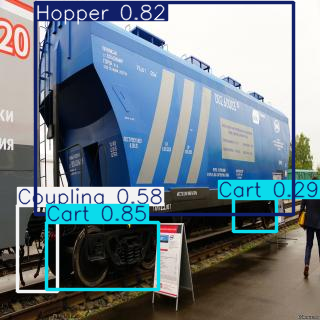

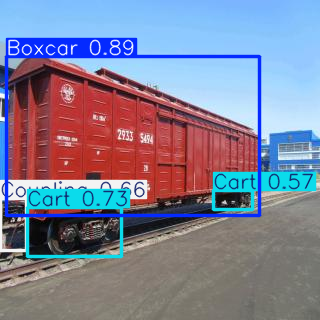

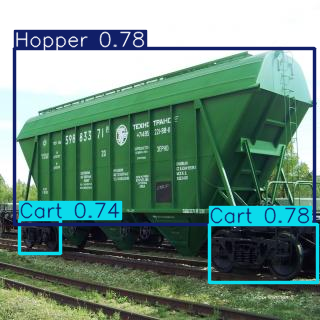

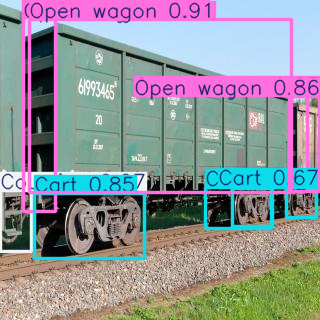

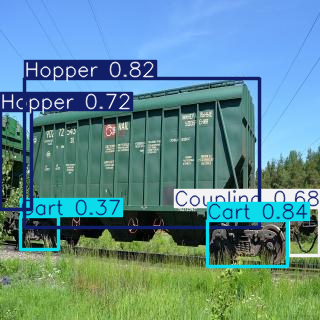

...

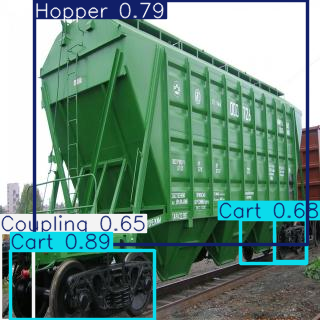

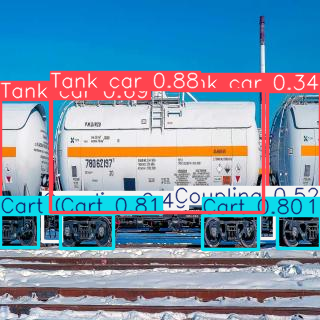

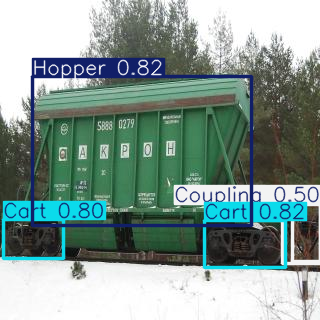

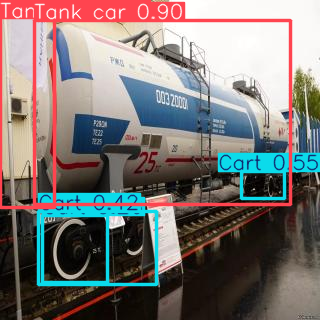

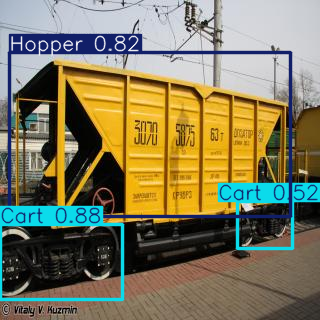

In [33]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train4/weights/best.pt")

results = model(full_paths)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    result.show()
    result.save(filename="result.jpg")

In [34]:
metrics = model.val()

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/october-vagons-4/valid/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]


                   all         63        329      0.866      0.774      0.881      0.615
                Boxcar          7         10      0.855        0.9      0.927      0.751
                  Cart         63        158      0.924      0.846      0.932      0.626
              Coupling         45         56      0.818      0.643      0.711      0.299
              Dump car          7         13          1      0.547      0.948      0.633
                Hopper         15         20      0.902        0.9      0.959      0.705
            Open wagon         14         21      0.702      0.762      0.761      0.575
              Tank car         28         51      0.857      0.823      0.931      0.715
Speed: 0.1ms preprocess, 25.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val4


In [35]:
metrics.box.f1

array([    0.87715,     0.88335,     0.72017,     0.70685,     0.90109,     0.73094,      0.8398])

In [36]:
metrics.box.all_ap

array([[    0.92726,     0.91195,     0.91195,     0.91195,     0.91195,     0.79512,     0.79512,     0.77502,     0.40951,     0.16383],
       [    0.93244,     0.93188,     0.91322,     0.87474,     0.79689,     0.71856,     0.58563,      0.3893,     0.11665,   0.0027711],
       [    0.71119,     0.66297,     0.59557,     0.47815,     0.27237,     0.17248,    0.058077,    0.031242,   0.0030124,   0.0030124],
       [    0.94764,     0.94764,     0.88421,     0.76046,     0.64495,     0.64495,     0.56848,     0.53394,     0.39453,           0],
       [    0.95859,     0.95859,     0.95859,     0.88294,     0.88294,     0.85684,     0.73461,     0.51107,     0.29133,   0.0096918],
       [    0.76131,      0.7565,      0.7565,      0.7565,     0.71394,      0.6539,     0.57608,     0.47215,     0.30325,   0.0034148],
       [    0.93078,      0.9183,      0.9183,      0.9183,     0.89924,     0.83741,     0.74651,     0.58261,     0.34826,    0.049485]])